<a href=https://uplimit.com/course/r-for-data-science>
  <img src=https://imgur.com/6Vkc11w.png />
</a>

|        |                                   |                                   |                                 |                                |
| -------| ----------------------------------| -------------------------------- -| --------------------------------| ------------------------------------------|
| Week 1 | [[01] Doing Data Science](https://colab.research.google.com/drive/1aWpmzS36qVc8hNIaSSSHexlodwwyMJCB)           | [[02] Data Science in Action](https://colab.research.google.com/drive/1aWpmzS36qVc8hNIaSSSHexlodwwyMJCB)       | [[03] Importing Data](https://colab.research.google.com/drive/13kHBX3H1F2yx5yXWJ5iFZh48qjEtpLjU)             | [[04] Visualizing Data: Overview](https://colab.research.google.com/drive/1JSeDt-Gneegd5B2KwWTJF_igYPb-xsIv)          |
|        | [[05] Transforming Data: Overview](https://colab.research.google.com/drive/1IMZJFE8WmwjgdYCddvaO386PljKq_PjC)  | [[06] Transforming Data: Manipulate](https://colab.research.google.com/drive/19ClnAH7d30I9PkD9KuZndPmy5hxk3gdi) |                                 |                                           |
| Week 2 | [[07] Transforming Data: Aggregate](https://colab.research.google.com/drive/1zigvePewKpzKQHx2pjABXU6Ms8QzQXj7) | [[08] Transforming Data: Reshape](https://colab.research.google.com/drive/1Ma9VrM9SrkNEeXTSul0Ca8a7GHAeNLzC)   | [[09] Transforming Data: Combine](https://colab.research.google.com/drive/1JUGm1h4YPmCkre-rVUj5Ql7lBS66_xIs) | [[10] Visualizing Data: Grammar of Graphics](https://colab.research.google.com/drive/1YLE3NPp-TO2KUTohtidjzKMeqJVWxYoT) |
|        | [[11] Data Science in Action Again](https://colab.research.google.com/drive/1eWjVK4oEiXdwdP4sT0nOJlmkCMBkfLpz) |                                   |                                 |                                           |
Books | [Hands on Programming with R](https://rstudio-education.github.io/hopr/index.html) | [R for Data Science](https://r4ds.hadley.nz/) | [Elegant Graphics for Data Analysis](https://ggplot2-book.org/)



> 📕 __BEFORE YOU GET STARTED:__
> 1. Click on **Copy to Drive** to copy notebook to your drive.
> 2. Click on **Share** on the top-right corner (of your copied notebook).
> 3. Update sharing settings to **Anyone with link**
> 4. Delete this cell.


## Visualizing Data: Grammar of Graphics

The __Grammar of Graphics__ is a framework for creating visualizations that was introduced by Leland Wilkinson in his [book](https://www.amazon.com/Grammar-Graphics-Statistics-Computing/dp/0387245448) of the same name. It is based on the idea that a plot can be thought of as a set of layers, each representing different components of the data. The Grammar of Graphics provides a set of rules for how these layers should be combined to create a coherent and informative visualization.

<img src="https://i.imgur.com/ml4PGon.png" height=300px/>

[`ggplot2`](https://ggplot2.tidyverse.org) is an R package that implements the __Grammar of Graphics__. It provides a powerful and flexible system for creating a wide variety of plots, including scatterplots, line plots, bar charts, histograms, and more. The ggplot2 syntax is designed to be intuitive and easy to use, allowing users to quickly create complex visualizations with just a few lines of code.

The key components of a `ggplot2` plot are the `data`, the `aesthetic` mappings, the `layers` consisting of `geometric` objects and `statistical` transformations, the `scales`, the `coordinates`, the `facets` and `theme`.

- __Data__ The set of observations being plotted.
- __Aesthetic__ mappings specify how the data should be mapped to visual properties such as color, shape, and size.
- __Layers__ represent the visual elements of the plot, such as points, lines, and bars.
- __Scales__ control how the data is represented in the plot, such as the range of values for the axes.
- __Coordinates__ map data into the plot panel
- __Facets__ allow users to create multiple plots based on different subsets of the data.
- __Themes__ control the overal visual defaults of the plot

Together, these components allow users to create a wide range of visualizations that can be customized to their specific needs. The ggplot2 syntax is designed to be intuitive and easy to use, allowing users to quickly create complex visualizations with just a few lines of code.

In [ ]:
# Load packages and common utility functions
library(tidyverse)
url = "https://gist.githubusercontent.com/ramnathv/e71d3ffe88961fc4ef95642053012384/raw/c3a1986e73213cd842ace971ecb8c60bd4c30fdf/_common.R"
download.file(url, basename(url))
source("_common.R")

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Tracing function "install.packages" in package "utils"

Tracing function "update.packages" in package "utils"

Installing packages into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘checkmate’, ‘htmlwidgets’, ‘gridExtra’, ‘htmlTable’, ‘viridis’, ‘Formula’


Inspecting installed packages...



In this lesson, we will explore the grammar of graphics to understand its true powers.

### Data

Tidy Data is the fundamental starting point of all data visualizations. Note that in the real-world, datasets are almost always messy and it takes a lot of effort to wrangle them and whip them into shape to visualize them. We will use the tidy dataset `diamonds` that we used previously.

In [ ]:
diamonds <- diamonds |>
  filter(carat <= 3) |>
  slice_sample(prop = 0.2)

head(diamonds)

carat,cut,color,clarity,depth,table,price,x,y,z
<dbl>,<ord>,<ord>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
0.36,Premium,G,VS1,62.2,59,932,4.57,4.53,2.83
1.45,Premium,H,VS2,58.4,59,9216,7.44,7.42,4.34
2.01,Very Good,G,SI2,63.3,56,12271,8.06,8.01,5.08
0.90,Fair,G,SI1,64.5,57,3629,6.07,6.03,3.90
0.42,Ideal,G,VS2,62.2,54,847,4.80,4.82,2.99
0.41,Ideal,E,VS2,62.2,56,1087,4.80,4.75,2.97


### Aesthetics

Aesthetics map columns in the data to visual properties on the plot.

<img src="https://clauswilke.com/dataviz/aesthetic_mapping_files/figure-html/common-aesthetics-1.png" height=300px />


Some of the most commonly supported aesthetic mappings are:

- `x` and `y` positions
- `color`: color of points, lines, and shapes
- `fill`: color of bars and areas
- `alpha`: transparency of points, lines, and shapes
- `shape`: shape of points
- `size`: size of points
- `linetype`: type of line
- `group`: grouping of data for certain geoms (lines / facets)
- `label`: text labels for points, bars, and lines

Let us create a scatterplot using four different aesthetic mappings. Note that we are creating this plot only for illustrative purposes and this is not a representation of best practice.


In [ ]:
diamonds |>
  # Randomly select 10% of the rows from the dataframe for this example
  ggplot(aes(
    x = carat,
    y = price,
    color = color,
    shape = clarity
  )) +
  geom_point()

Warning message:
“Using shapes for an ordinal variable is not advised”
Warning message:
“The shape palette can deal with a maximum of 6 discrete values because
more than 6 becomes difficult to discriminate; you have 8. Consider
specifying shapes manually if you must have them.”
Warning message:
“Removed 1092 rows containing missing values (`geom_point()`).”


Note that not all aesthetic mappings are applicable to every type of plot, and some `geoms` may support additional aesthetic mappings not listed here. The full list of aesthetic mappings can be found in the ggplot2 documentation.

### Layers

Every plot is composed of __layers__. `ggplot2` allows you to compose a plot by adding multiple graphical layers together. Layers are added to a `ggplot` object using the `+` operator, and can include different types of `geom` layers and `stat` transformations, as well as other graphical elements such as __annotations__, __axis labels__, and __legends__.

Let us refresh our memory by replicating a scatterplot for the `diamonds` dataset that we created earlier.

In [ ]:
diamonds |>
  ggplot() +
  aes(x = carat, y = price, color = cut) +
  geom_point(alpha = 0.5) +
  geom_smooth(method = "lm", se = FALSE) +
  labs(
    title = "Diamond Prices vs. Carat Weight",
    x = "Carat Weight",
    y = "Price",
    color = "Cut"
  )

`geom_smooth()` using formula = 'y ~ x'


In this example, we first create a basic `ggplot` object using the `diamonds` dataset, mapping the `carat` variable to the x-axis, the `price` variable to the y-axis, and the `cut` variable to the color aesthetic. We then add two layers to the plot using the `+` operator:

- The first layer is a `geom_point()` layer, which creates a scatter plot of the data points, with points colored by cut. We set `alpha = 0.5` to make the points slightly transparent.
- The second layer is a `geom_smooth()` layer, which adds a linear regression line to the plot, also colored by cut. We set `method = "lm"` to specify that we want to use a linear regression model to fit the line, and `se = FALSE` to remove the shading around the line.

We then add additional graphical elements to the plot using various functions and options:

- The `labs()` function is used to set the plot title, axis labels, and legend title.
- The `theme_bw()` function is used to set the plot theme to a simple black-and-white style.

By combining different layers and graphical elements in this way, you can create highly customizable and informative visualizations that convey complex information in an intuitive and visually appealing manner.

You can create layers using the `geometries` and `stats`.

#### Geometries

The `geom` layer is used to specify the type of geometric object that you want to use to represent your data, such as points, lines, bars, or polygons. The `geom` layer is added to a `ggplot` object to create a plot that displays your data in a visual form.

Here are some examples using the `diamonds` dataset to demonstrate the use of different `geom` layers:

In [ ]:
# Scatter plot of price vs. carat, colored by cut
ggplot(diamonds, aes(x = carat, y = price, color = cut)) +
  geom_point(alpha = 0.5)

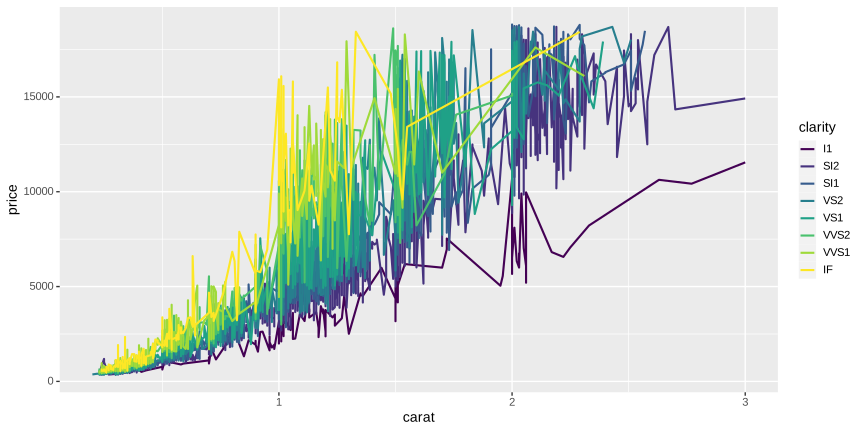

In [ ]:
# Line plot of price vs. carat, colored by clarity
ggplot(diamonds, aes(x = carat, y = price, color = clarity)) +
  geom_line(linewidth = 1)

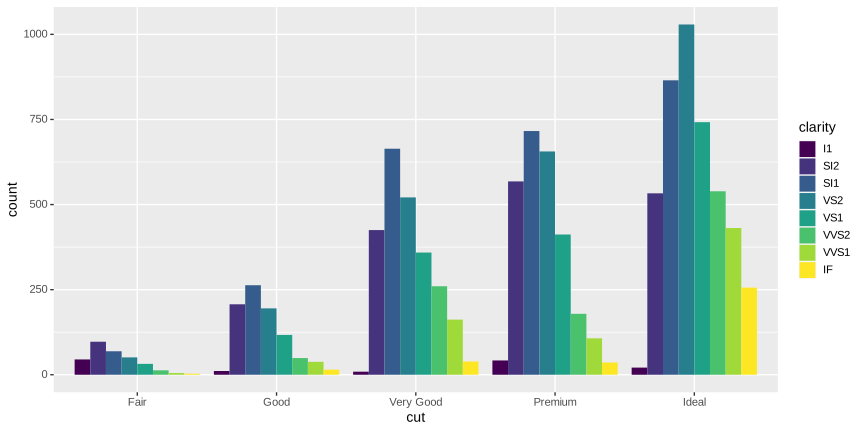

In [ ]:
# Bar plot of diamond count by cut, colored by clarity
ggplot(diamonds, aes(x = cut, fill = clarity)) +
  geom_bar(position = "dodge")

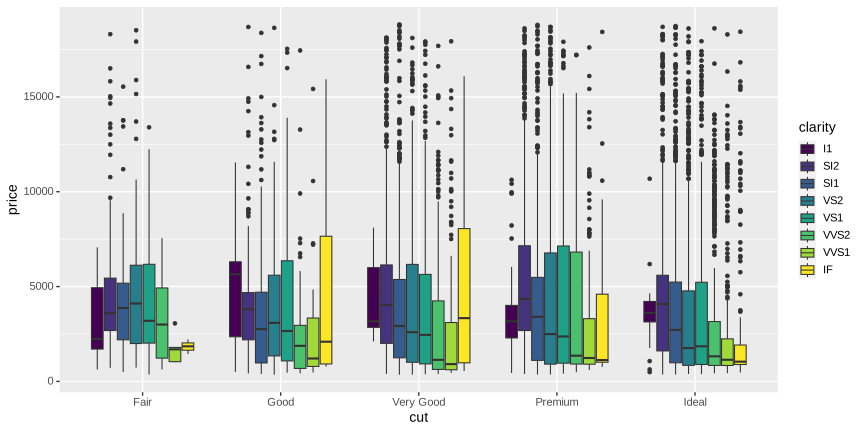

In [ ]:
# Box plot of price by cut, colored by clarity
ggplot(diamonds, aes(x = cut, y = price, fill = clarity)) +
  geom_boxplot()

#### Statistics

Suppose you want to plot summary statistics of `price_per_carat` by `clarity`. Rather than use a `boxplot`, you want to use an error bar ranging from -2 standard deviations from the mean to +2 standard deviations from the mean. You can create this plot by computing the statistical summaries required and then using the `geom_point()` and `geom_errorbar()` functions.

In [ ]:
diamonds |>
  head()

carat,cut,color,clarity,depth,table,price,x,y,z
<dbl>,<ord>,<ord>,<ord>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>
0.36,Premium,G,VS1,62.2,59,932,4.57,4.53,2.83
1.45,Premium,H,VS2,58.4,59,9216,7.44,7.42,4.34
2.01,Very Good,G,SI2,63.3,56,12271,8.06,8.01,5.08
0.90,Fair,G,SI1,64.5,57,3629,6.07,6.03,3.90
0.42,Ideal,G,VS2,62.2,54,847,4.80,4.82,2.99
0.41,Ideal,E,VS2,62.2,56,1087,4.80,4.75,2.97


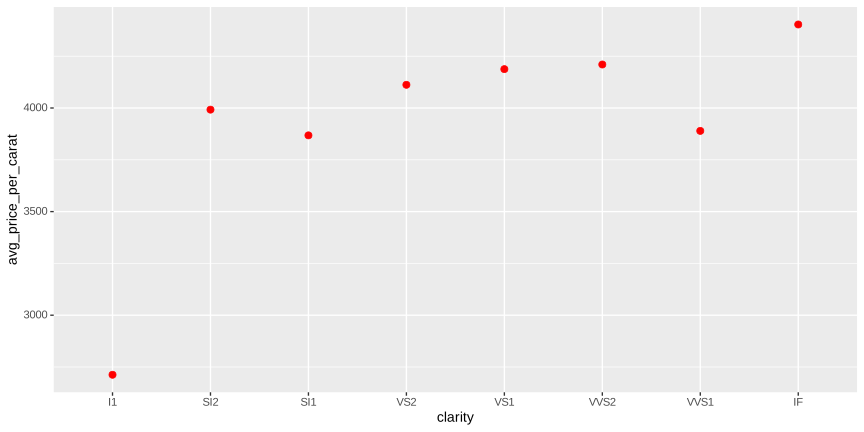

In [ ]:
diamonds |>
  # Group by clarity
  group_by(clarity) |>
  # Summarize mean and standard deviation of price_per_carat
  summarize(
    avg_price_per_carat = mean(price/carat),
    sd_price_per_carat = sd(price/carat),
    .groups = "drop"
  ) |>
  # Initialize ggplot of avg_price_per_carat vs. clarity
  ggplot(aes(
    x = clarity,
    y = avg_price_per_carat
  )) +
  # Add a point layer
  geom_point(color = 'red', size = 3)

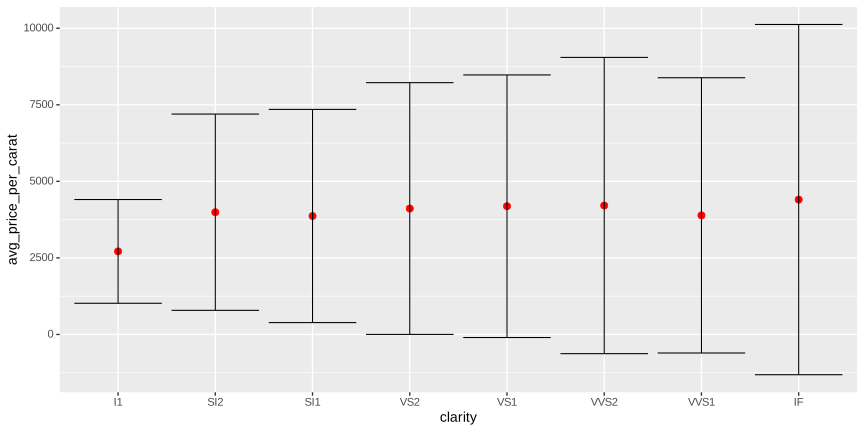

In [ ]:
diamonds |>
  # Group by clarity
  group_by(clarity) |>
  # Summarize mean and standard deviation of price_per_carat
  summarize(
    avg_price_per_carat = mean(price/carat),
    sd_price_per_carat = sd(price/carat),
    .groups = "drop"
  ) |>
  # Initialize ggplot of avg_price_per_carat vs. clarity
  ggplot(aes(
    x = clarity,
    y = avg_price_per_carat
  )) +
  # Add a point layer
  geom_point(color = 'red', size = 3) +
  # Add an errorbar layer with ymin and ymax
  geom_errorbar(aes(
    ymin = avg_price_per_carat - 2 * sd_price_per_carat,
    ymax = avg_price_per_carat + 2 * sd_price_per_carat
  ))

Transforming the data prior to plotting always works for every plot. However, `ggplot2` provides another mechanism to carry out statistical transformations out of the box. You already saw it in action when you used `geom_boxplot` and `geom_violin`. Both these functions automatically carry out statistical transformations on the data before plotting them.

`ggplot2` ships with several statistical transformations out of the box, that allow you to create sophisticated statistical plots without having to pre-compute values. In this example, we can use the simplest of stat functions in `ggplot2`, `stat_summary`, which applies a user defined function on the data before plotting it.

1. First, we use `stat_summary` with the `mean()` function to get the avg price per carat and plot it using a `point` geometric object.

2. Next, we use `stat_summary` with the `mean_sdl()` function to compute the avg price per carat, as well as plus/minus 2 standard deviations from it, and plot it using a an `errorbar` geometric object.

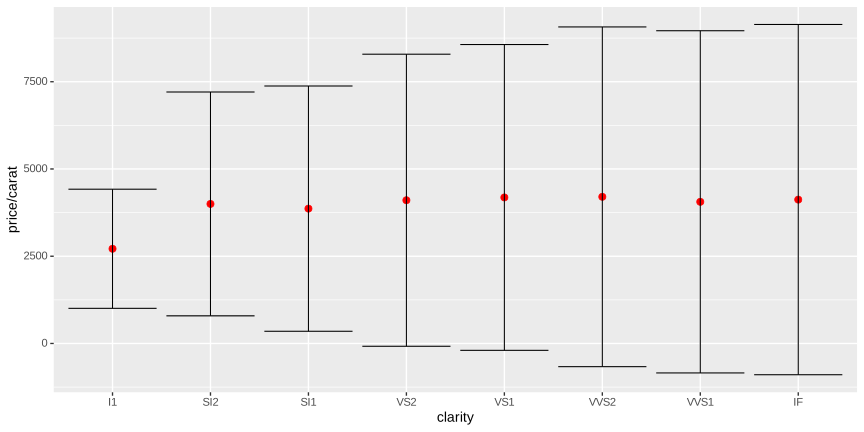

In [ ]:
diamonds |>
  # Initialize a plot of price/carat vs. clarity
  ggplot(aes(
    x = clarity,
    y = price / carat
  )) +
  # Compute stat. summary, mean price/carat and display as point
  stat_summary(
    geom = "point",
    fun = mean,
    color = 'red',
    size = 3
  ) +
  # Compute stat. summary, mean_sdl price/carat and display as errorbar
  stat_summary(
    geom = "errorbar",
    fun.data = mean_sdl
  )

We can rewrite this code in terms of geometric objects directly and passing the statistic as an argument. In other words, the `geom_***` and `stat_***` functions can be used interchangeably. Every `geom` object has a default `stat` and every `stat` has a default `geom` object.

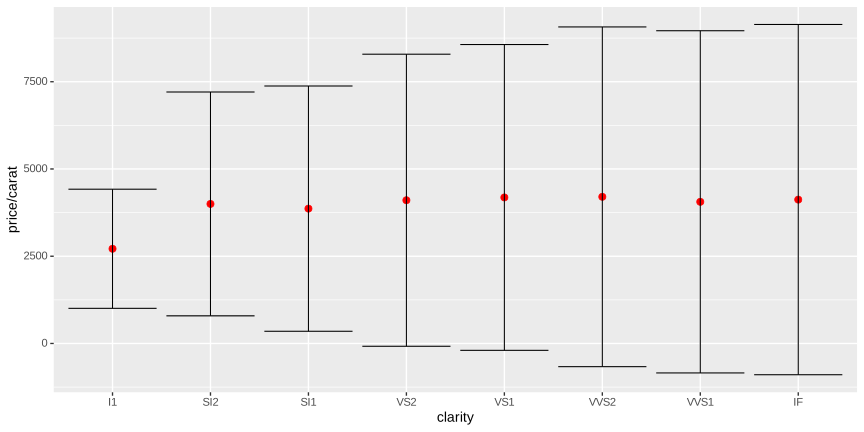

In [ ]:
diamonds |>
  ggplot(aes(
    x = clarity,
    y = price / carat
  )) +
  geom_point(
    stat = "summary",
    fun = mean,
    color = 'red',
    size = 3
  ) +
  geom_errorbar(
    stat = "summary",
    fun.data = mean_sdl
  )

Mastering the different __`geom`__ and __`stat`__ layer functions will let you create sophisticated data visualizations with ease as you can build your plot up layer by layer.

### Scales

__Scales__ control how the data is represented in the plot. They are responsible for mapping the range of the data onto the range of the plot, such as the range of values for the axes or the color scale for a `heatmap`.

Scales in `ggplot2` can be continuous or discrete. Continuous scales are used for numerical data, such as the values on the `x` and `y` axes, and can be further classified as either linear or logarithmic scales. Discrete scales are used for categorical data, such as the labels on the x and y axes, and can be further classified as either nominal or ordinal scales.

In addition to the basic scales for `x` and `y` axes, ggplot2 provides many other scales for controlling the appearance of a plot, such as `color` scales, `fill` scales, and `size` scales. These scales allow users to customize the visual appearance of their plot in a wide variety of ways.

Here are some examples of using scales.

__Changing the axis labels and limits__

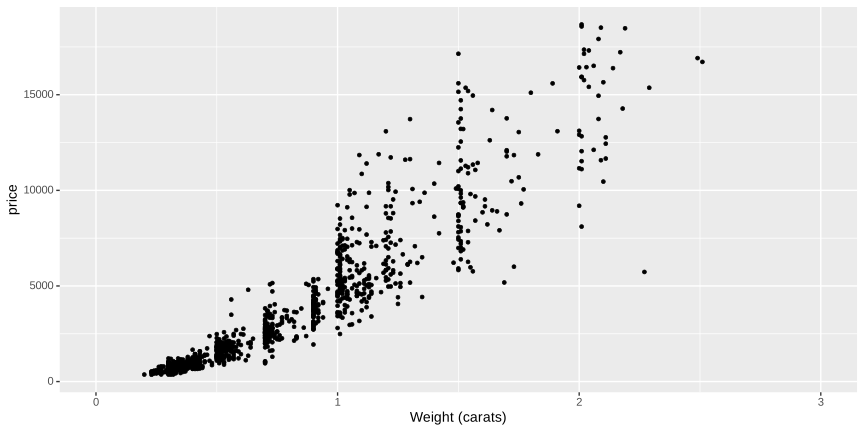

In [ ]:
diamonds |>
  sample_frac(0.10) |>
  ggplot(aes(x = carat, y = price)) +
  geom_point() +
  scale_x_continuous(name = "Weight (carats)", limits = c(0, 3))

This code creates a scatterplot of diamond weight (carat) versus price for the `diamonds` dataset. The `scale_x_continuous()` function is used to change the label of the x-axis to "Weight (carats)" and set the limits of the x-axis to range from 0 to 3.

__Using a logarithmic scale__

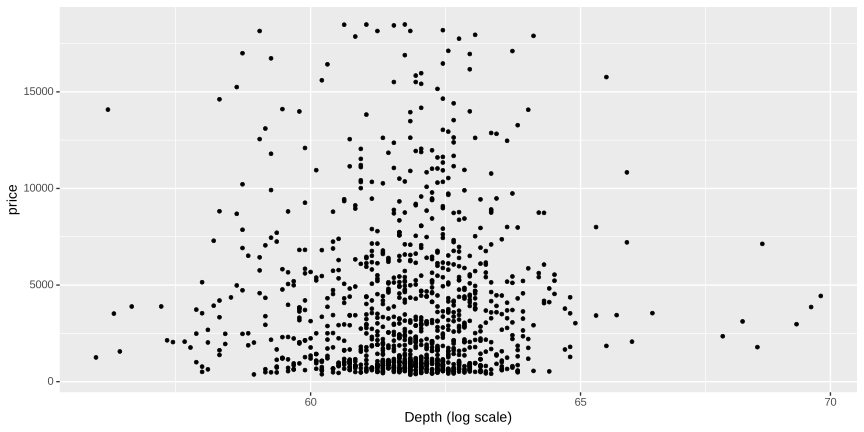

In [ ]:
diamonds |>
  sample_frac(0.10) |>
  ggplot(aes(x = depth, y = price)) +
  geom_point() +
  scale_x_log10(name = "Depth (log scale)")

This code creates a scatterplot of diamond depth versus price for the `diamonds` dataset. The `scale_x_log10()` function is used to change the x-axis scale to a logarithmic scale with a base of 10. The label of the x-axis is also changed to "Depth (log scale)".

__Changing the color scale__

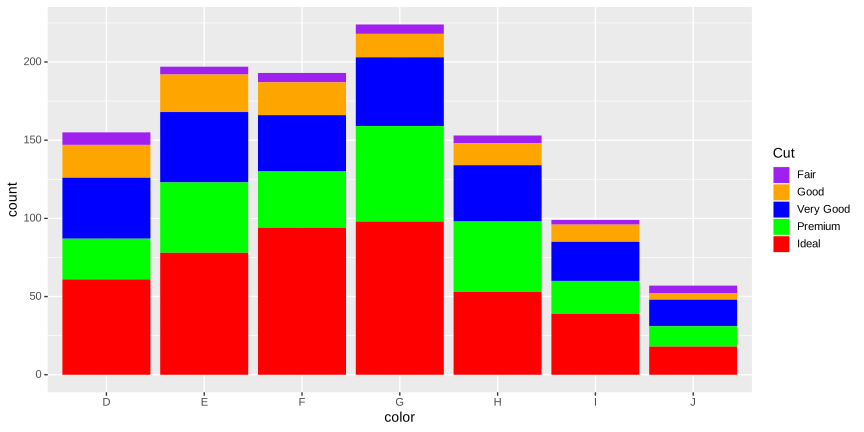

In [ ]:
diamonds |>
  sample_frac(0.10) |>
  ggplot(aes(x = color, fill = cut)) +
  geom_bar() +
  scale_fill_manual(
    name = "Cut",
    values = c(
      "Ideal" = "red",
      "Premium" = "green",
      "Very Good" = "blue",
      "Good" = "orange",
      "Fair" = "purple"
    )
  )

### Facets

Faceting in `ggplot2` is a powerful tool for creating multi-panel plots, allowing you to break down your data into smaller, more manageable subsets based on one or more categorical variables. The `facet_wrap()` and `facet_grid()` functions provide two different approaches to creating faceted plots.

We already covered faceting in an earlier lesson. Feel free to type `? facet_wrap` and `? facet_grid` to explore the different arguments supported by these functions.

### Coordinates

Consider the following stacked bar plot of diamonds by `cut`.

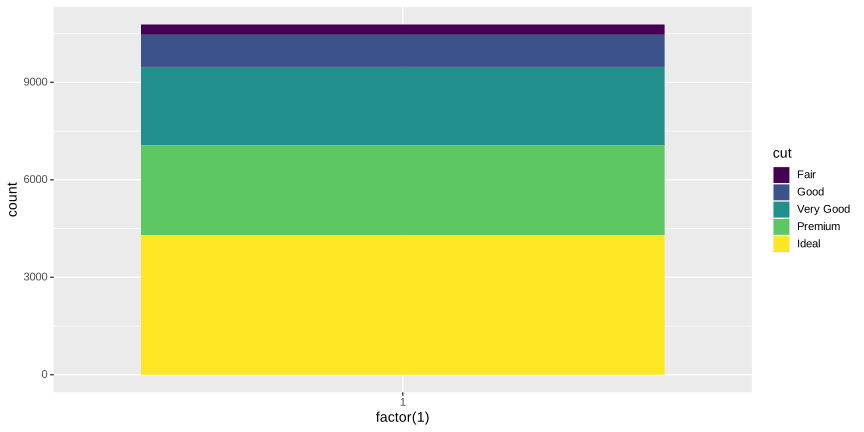

In [ ]:
diamonds |>
  ggplot(aes(x = factor(1), fill = cut)) +
  geom_bar()

The coordinates default to the cartesian system (`coord_cartesian()`). What if we wanted to display a pie chart instead of a bar chart? The beauty of the grammar of graphics is that a pie chart is the same as a bar chart, EXCEPT that it uses polar coordinates. So, all we need to do to draw a pie chart is to take the same code, but add a `coord_polar()` on top of it, and lo and behold, we have our amazing pie chart!


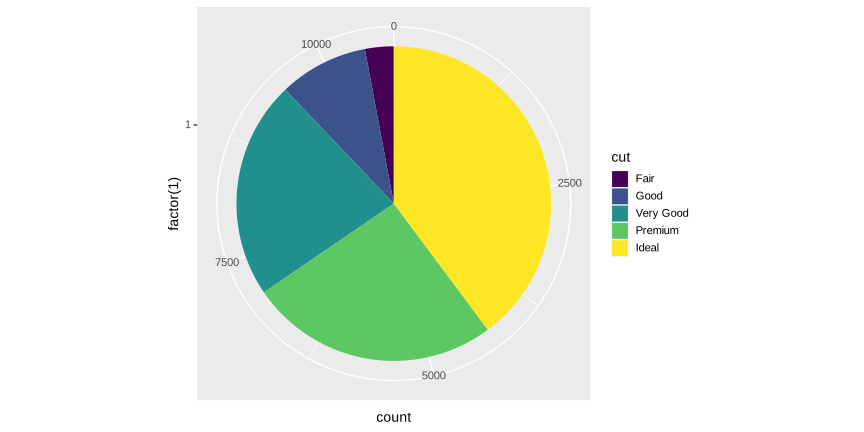

In [ ]:
diamonds |>
  ggplot(aes(x = factor(1), fill = cut)) +
  geom_bar() +
  coord_polar(theta = "y")

---

Please not that this is not an invitation to draw pie charts. Pie charts are NOT useful EXCEPT under a very limited set of conditions, so please do not use them, unless you know what you are doing!)

---

If you type `coord_` and hit the tab button, you can cycle through the different coordinate transformations that are supported by `ggplot2`. The mapping ones in particular are very useful for spatial visualizations.


### Themes

Finally, __themes__ control the overall visual defaults of the plot. Themes make it easy to skin the plot based on a style guide. The `ggplot2` package supports a small set of themes including `theme_gray()`, which is the default. The `ggthemes` and `ggtech` packages support several alternative themes.

